# 유방암, 현미경 소견을 통한 예측 : Intro

## 암!
한국 사회, 부동의 사망 원인 1위! **암**!
<img src= "http://www.docdocdoc.co.kr/news/photo/201609/222913_75593_1109.jpg" alt="사망원인 통계" width="70%">

<div style="text-align:end;"> - 출처: <a href="http://kostat.go.kr/portal/korea/kor_nw/2/6/2/index.board?bmode=read&bSeq=&aSeq=363268&pageNo=1&rowNum=10&navCount=10&currPg=&sTarget=title&sTxt=">통계청</a></div>

그 중에서도 유방암은 여성에서 발생률 2위에 달하는 '흔한'암이다. 

보통은 건강검진에서 유방에 미심쩍은 덩어리가 발견되면, 

초음파와 조직검사를 실시하여 암을 확진한다. 

조직검사는 여러가지 방법으로 이루어질 수 있지만 

고전적으로 현미경을 이용한 관찰은 빠지지 않는다. 

그렇다면 유방암 세포를 현미경으로 보고, '암'인지 그냥 '덩어리'인지 예측할 수 있을까?

우리는 그 대답을 <a href="https://www.kaggle.com/uciml/breast-cancer-wisconsin-data#data.csv">UCI ML breast dataset</a>속에서 찾아보기로 했다. 


## Breast Cancer Wisconsin (Diagnostic) Data Set 
### 데이터 설명

UCI ML : Breast Cancer Data Set은 569명의 유방암 환자에서 

조직검사의 일종인 FNA(Fine Needle Aspiration)을 실시하고,

현미경으로 **세포의 핵**을 관찰한 결과와, 진단 결과를 정리한 데이터이다. 

<img src="https://www.cancer.org/cancer/breast-cancer/screening-tests-and-early-detection/breast-biopsy/fine-needle-aspiration-biopsy-of-the-breast/_jcr_content/par/image.img.gif/1507921878230.gif" width="50%" alt="Fine Needle Aspiration">

요새는 저것보다 큰 조직생검 기계로 gun biopsy를 하기도 하지만..! 

1990년대 초반데이터임을 고려해야겠다.

**하필 왜 핵이냐?** 라고 묻는다면, 암은 기본적으로 세포 분열에 문제가 생기는 질병이기 때문에, 

암세포에서는 세포분열시 변화하는 **핵**이 이상하게 생겼을 가능성이 높기 때문이라고 생각할 수 있다. 

### 변수 설명
변수를 살펴보면 
1. ID number : 암 조직을 제공한 개인 식별 숫자
2. Diagnosis (M = malignant, B = benign) : 악성 암(M)인지, 양성 덩어리(B)인지 진단 결과

이외에 각각 다음과 같은 성질들의 mean(평균), se(표준편차), worst(최대값)으로 이루어져있다. 

1. radius : 핵의 중심으로부터 표면까지의 평균 거리
2. texture : 색깔을 gray-scale로 바꿨을때, 색의 표준편자
3. perimeter : 둘레
4. area : 면적
5. smoothness : (local variation in radius lengths)
6. compactness (perimeter^2 / area - 1.0)
7. concavity : 바깥 경계에서 오목한 부분의 정도
8. concave points : 바깥 경계가 오목한 부분의 수
9. symmetry 
10. fractal dimension ("coastline approximation" - 1)

위의 값들은 핵 이미지를 컴퓨터로 분석하여 얻은 수치들이다. 


## 분석 계획


우선
1. 데이터를 살펴보고
2. 통계적으로 간단한 로지스틱 모형을 적합하고
3. 1~2가지 기계학습 방법을 적용해보아 

위에서 서술한 세포핵의 외형적 성질을 바탕으로, 암세포를 구분해낼 수 있는지, 

어떤 방식이 좋은지 알아보자!

# 탐색적 분석

데이터를 받아오고, 데이터가 어떤 모양인지 먼저 살펴보자. 

## 데이터의 기본 수치 파악

필요한 library와 데이터를 불러오자

In [1]:
import pandas as pd
import numpy as np

In [2]:
raw_data = pd.read_csv('data.csv')
raw_data.head(6)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN
5,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.1578,0.08089,...,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440,NaN


In [3]:
# 변수들이 잘 불려왔는지 확인
print(raw_data.columns, raw_data.shape)

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32'],
      dtype='object') (569, 33)


마지막 열은 필요 없는 것으로 보이므로 제거하자

In [4]:
raw_data = raw_data.drop(labels='Unnamed: 32', axis = 1)
raw_data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


요약지표를 확인해보자

In [5]:
# summary 확인
raw_data.describe().round(3)

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.690000e+02,569.000,569.000,569.000,569.000,569.000,569.000,569.000,569.000,569.000,...,569.000,569.000,569.000,569.000,569.000,569.000,569.000,569.000,569.000,569.000
mean,3.037183e+07,14.127,19.290,91.969,654.889,0.096,0.104,0.089,0.049,0.181,...,16.269,25.677,107.261,880.583,0.132,0.254,0.272,0.115,0.290,0.084
std,1.250206e+08,3.524,4.301,24.299,351.914,0.014,0.053,0.080,0.039,0.027,...,4.833,6.146,33.603,569.357,0.023,0.157,0.209,0.066,0.062,0.018
min,8.670000e+03,6.981,9.710,43.790,143.500,0.053,0.019,0.000,0.000,0.106,...,7.930,12.020,50.410,185.200,0.071,0.027,0.000,0.000,0.156,0.055
25%,8.692180e+05,11.700,16.170,75.170,420.300,0.086,0.065,0.030,0.020,0.162,...,13.010,21.080,84.110,515.300,0.117,0.147,0.114,0.065,0.250,0.071
50%,9.060240e+05,13.370,18.840,86.240,551.100,0.096,0.093,0.062,0.034,0.179,...,14.970,25.410,97.660,686.500,0.131,0.212,0.227,0.100,0.282,0.080
75%,8.813129e+06,15.780,21.800,104.100,782.700,0.105,0.130,0.131,0.074,0.196,...,18.790,29.720,125.400,1084.000,0.146,0.339,0.383,0.161,0.318,0.092
max,9.113205e+08,28.110,39.280,188.500,2501.000,0.163,0.345,0.427,0.201,0.304,...,36.040,49.540,251.200,4254.000,0.223,1.058,1.252,0.291,0.664,0.208


위의 값을 보면, mean 값이 0.1~1000 단위까지 다양하게 분포하고 있음을 알 수 있다. 

큰 상관은 없겠지만, 추후 분석의 용이성을 위해서는 

데이터를 정규화(normalization)시켜 사용하는 것이 좋을 것으로 보인다. 

count 가 전부 569로 행의 수와 같기 때문에, null 값이 없는 것으로 생각된다. 

이를 확인해보자. 

In [6]:
raw_data.isnull().sum(axis=0)

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

데이터가 극도로 정제된 것을 볼 수 있다. 
NA 값이 하나도 없다. 

NA 값이 전혀 없으므로, 빈 값에 대한 걱정 없이 다음 분석으로 넘어가보자. 

## 변수간의 상관성 파악

필요한 library를 불러오고 변수간의 관계를 파악해보자.

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [8]:
# 사용할 데이터 지정
data = raw_data.set_index(keys='id')

변수들의 상관관계를 살펴보기 위하여 seaborndml pairplot을 이용해보자. 

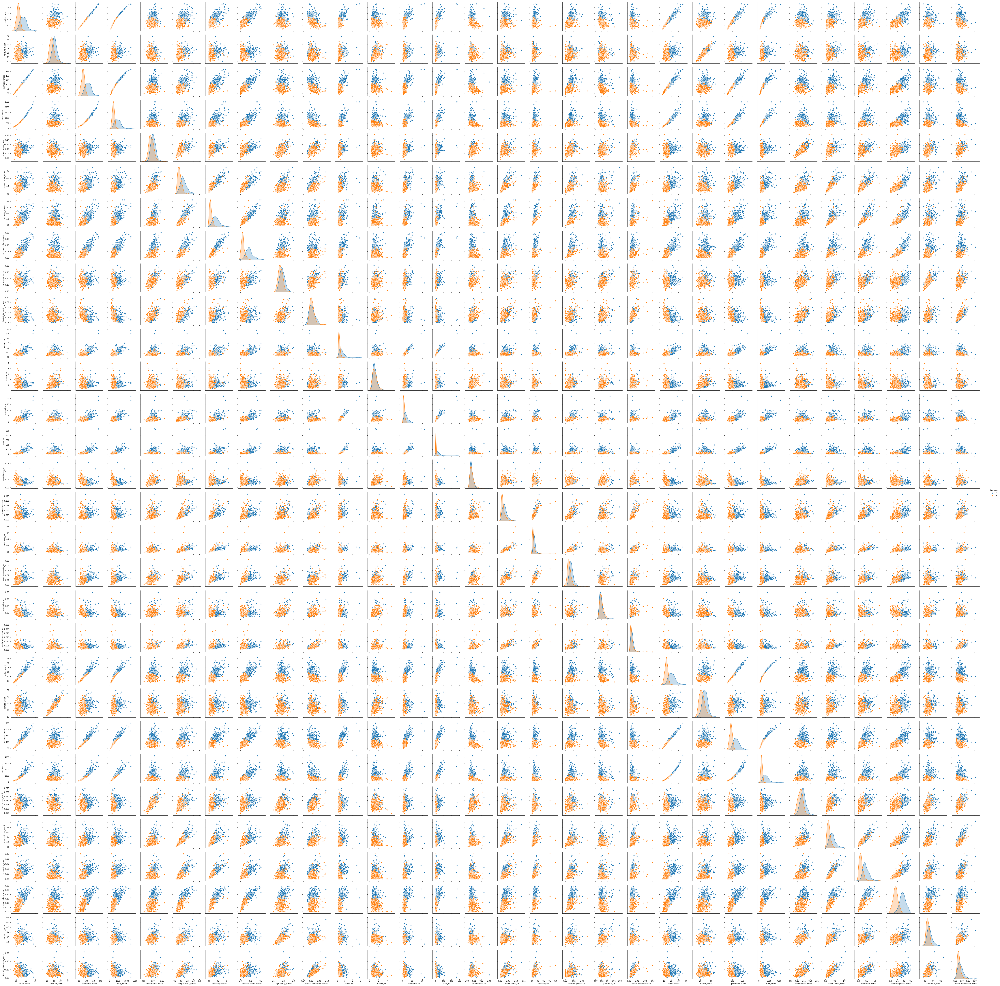

In [11]:
sns.pairplot(data, hue='diagnosis');

변수가 너무 많아서 보기 어렵다. 
데이터를 mean, se, worst 세가지로 나누어서 살펴보자. 

In [17]:
# 데이터 쪼개기
mean_data = data.iloc[:, data.columns.str.endswith('mean') + (data.columns=='diagnosis')]
se_data = data.iloc[:, data.columns.str.endswith('se') + (data.columns=='diagnosis')]
worst_data = data.iloc[:, data.columns.str.endswith('worst') + (data.columns=='diagnosis')]

In [13]:
mean_data.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean
id,,,,,,,,,,,
842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871
842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667
84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999
84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744
84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883


In [14]:
se_data.head()

,diagnosis,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se
id,,,,,,,,,,,
842302,M,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193
842517,M,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532
84300903,M,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571
84348301,M,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208
84358402,M,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115


In [15]:
worst_data.head()

,diagnosis,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
id,,,,,,,,,,,
842302,M,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
842517,M,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
84300903,M,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
84348301,M,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
84358402,M,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


잘 나뉘어졌으므로, 3그룹의 변수들 사이에서 상관관계를 살펴보자. 

### mean변수들 사이의 관계 파악

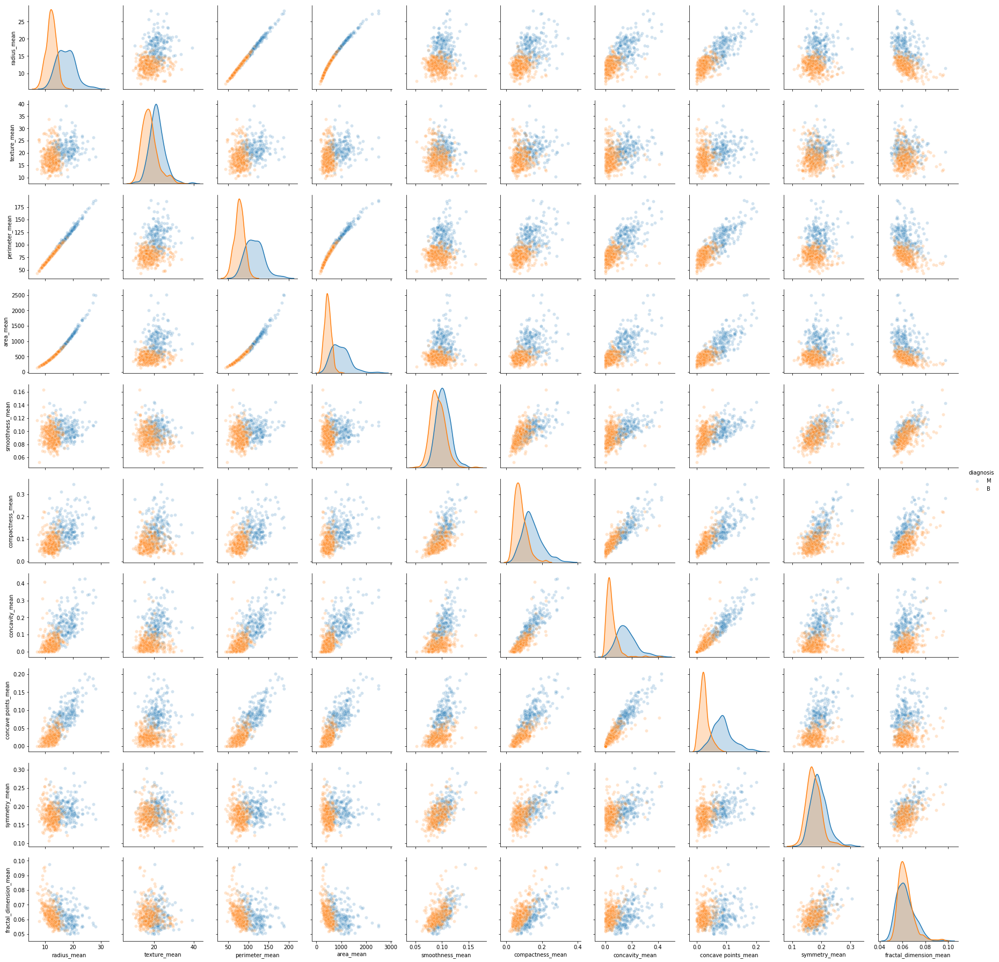

In [16]:
# 우선 mean 변수들 사이의 상관관계 그래프
sns.pairplot(mean_data, hue='diagnosis', diag_kind="kde", plot_kws={'alpha': 0.2});

거의 일직선으로 보일만큼 상관관계가 굉장히 높은 변수들이 눈에 띈다.
변수간 pairwise 상관관계를 도출해 이를 확인해 보도록 하겠다.

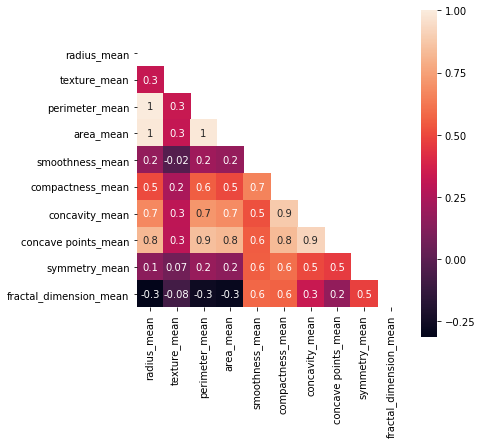

In [17]:
# 상관계수 행렬 계산 및 시각화
corr = mean_data.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize = (6,6))
sns.heatmap(corr, ax=ax, mask=mask, square=True, annot=True, fmt='.1g');

앞서 본 결과와 같이 상관계수가 0.9 에 육박하는 변수들이 있다. 

이 변수들만 모아서 한 번 살펴보자.

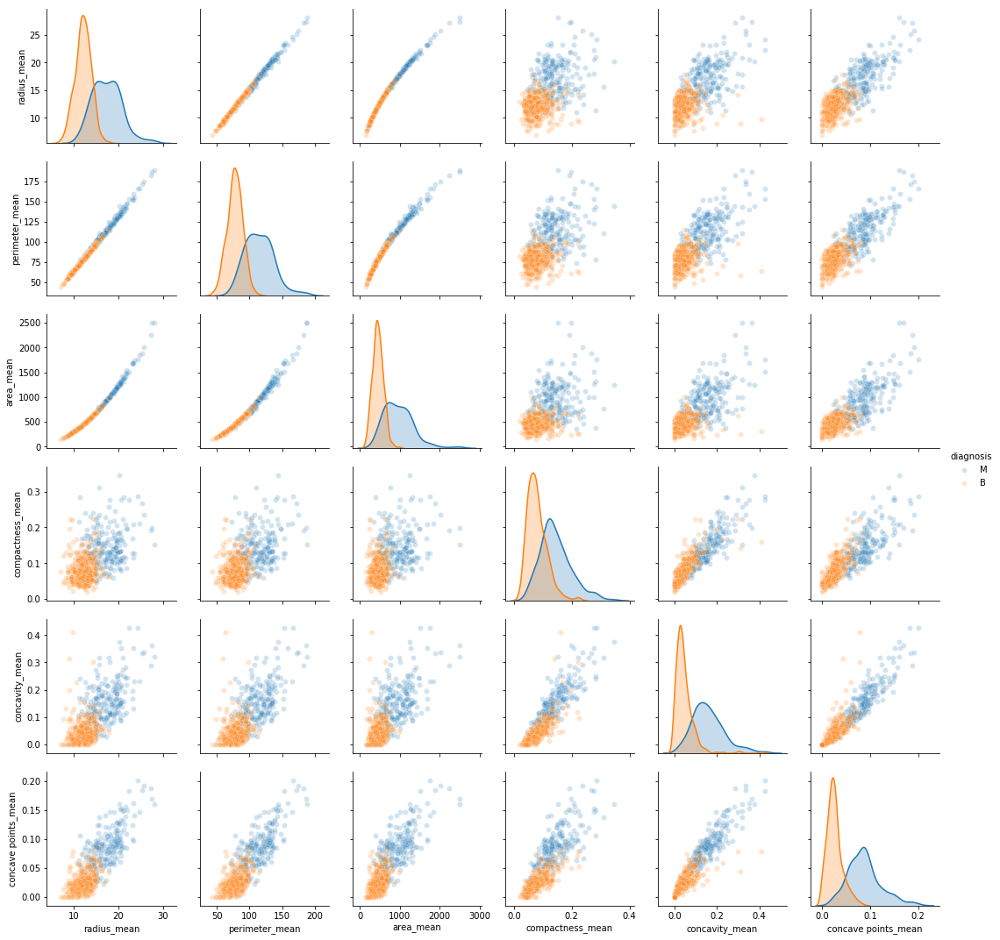

In [18]:
# 서로간의 상관계수가 0.9 이상인 변수들만 시각화
sns.pairplot(mean_data, hue='diagnosis', diag_kind="kde", plot_kws={'alpha': 0.2}, 
             vars=['radius_mean', 
                   'perimeter_mean', 
                   'area_mean',
                   'compactness_mean',
                   'concavity_mean',
                   'concave points_mean']);

세포의 핵 모양은 대체적으로 구형을 띄기 때문에, radius, perimeter, area가 강력한 상관관계를 갖는 것은 당연한 것으로 보인다. 

이 변수들은 셋 중 하나만 사용해도, 우리가 갖게 되는 정보량은 비슷할 것이다. 

마찬가지로 compactness_mean, concavity_mean, concave points_mean 도 상관관계가 매우 높은데, 

암세포와 비암세포를 구분하는데에 이들 중 하나만 사용해도 결과는 비슷할 것으로 생각된다. 

이와 같은 분석을 se(standard error)와 worst 에도 적용해보면 다음과 같다. 

### se변수들, worst 변수들 사이의 관계 파악

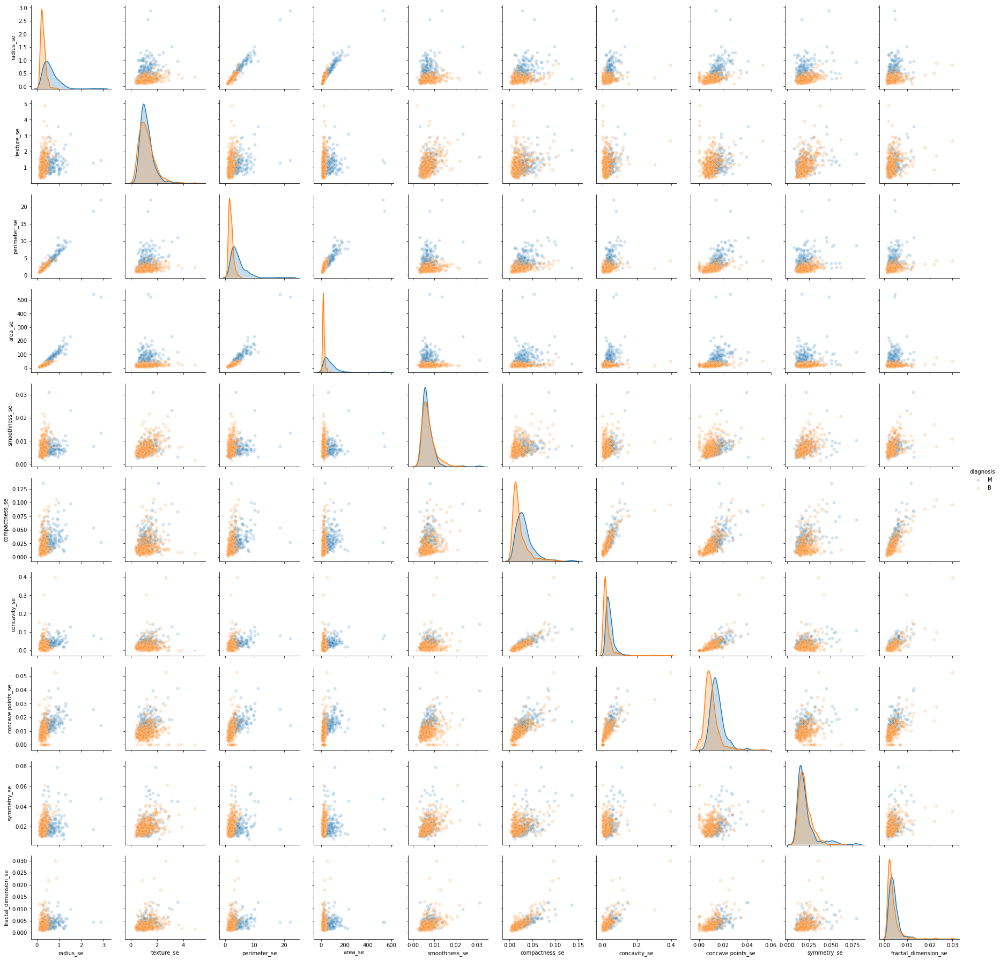

In [20]:
# se 변수들의 상관관계
sns.pairplot(se_data, hue='diagnosis', plot_kws={'alpha': 0.2});

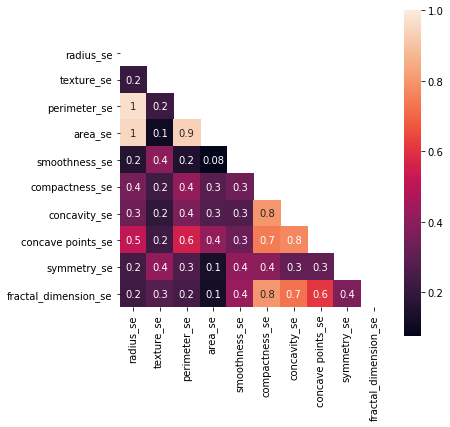

In [21]:
# se 변수 상관계수 행렬
corr = se_data.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize = (6,6))
sns.heatmap(corr, ax=ax, mask=mask, square=True, annot=True, fmt='.1g');

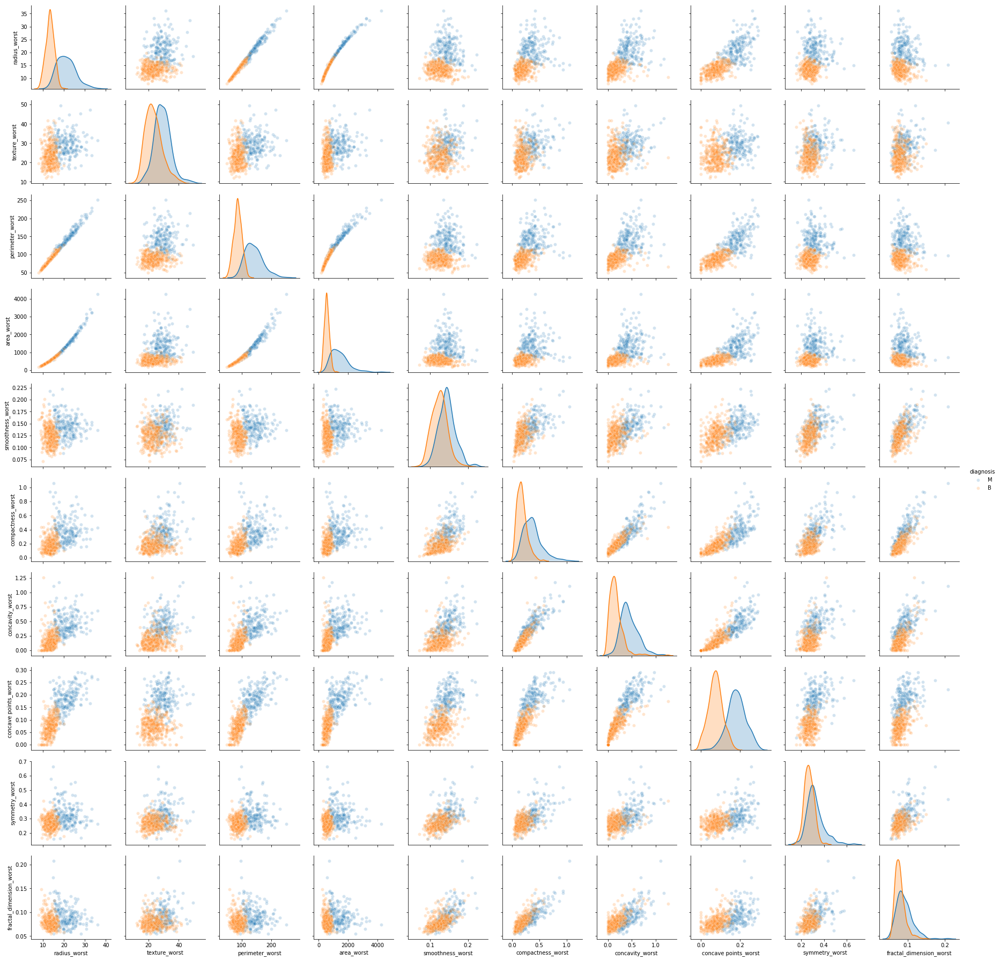

In [22]:
# worst 변수들의 상관관계
sns.pairplot(worst_data, hue='diagnosis', plot_kws={'alpha': 0.2});

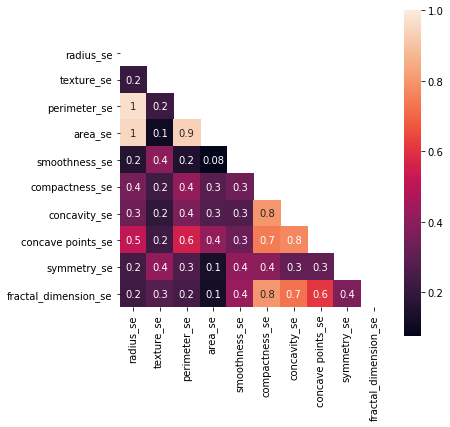

In [20]:
# worst 변수 상관계수 행렬
corr = se_data.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize = (6,6))
sns.heatmap(corr, ax=ax, mask=mask, square=True, annot=True, fmt='.1g');

se 나 worst 변수들간의 결과도 사실상 mean_data와 거의 다를바 없다. 

'radius_mean', 'perimeter_mean', 'area_mean' 이 서로 상관관계가 높고, 

'compactness_mean', 'concavity_mean', 'concave points_mean' 이 서로 상관 관계가 높다. 

그렇다면, mean, se, worst 데이터 간의 상관관계는 없을까? 

각각의 변수명이 같고, mean se worst 만 다른 변수들간의 상관관계를 한 번 살펴보자. 

### mean - se - worst 데이터 간의 상관관계 파악

In [25]:
# 변수 이름에서 앞의 공통 부분을 뽑아내자
names = mean_data.columns.str.replace('_mean','')
# diagnosis는 삭제
names = names.drop('diagnosis').values
names

array(['radius', 'texture', 'perimeter', 'area', 'smoothness',
       'compactness', 'concavity', 'concave points', 'symmetry',
       'fractal_dimension'], dtype=object)

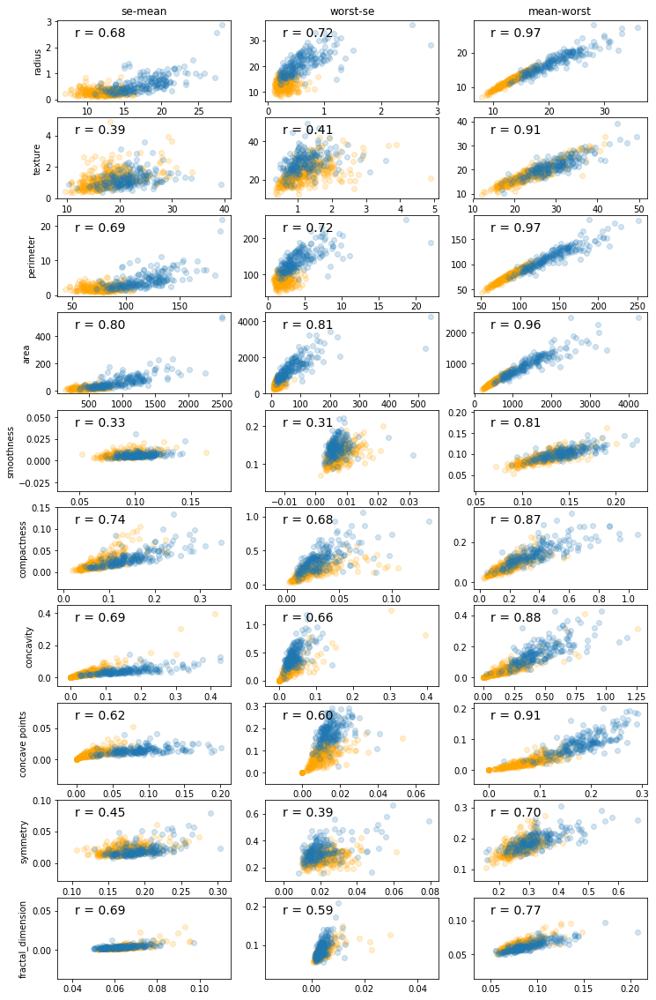

In [26]:
# 위에서 추출한 이름을 바탕으로, mean, se, worst 데이터간의 상관관계 그래프를 그려보았다
# 한 행 마다 공통 이름이 같은 변수간의 상관관계 그래프를 표시하였다

fig, ax = plt.subplots(nrows=10, ncols=3, figsize=(12,20))
for i, name in enumerate(names) :
    temp = pd.DataFrame({'diagnosis': data['diagnosis'],
                'mean': data[name+'_mean'], 
              'se': data[name+'_se'], 
              'worst': data[name+'_worst']})
    temp_B = temp.query("diagnosis == 'B'")
    temp_M = temp.query("diagnosis == 'M'")
    cor = [temp.corr().loc['mean', 'se'], 
           temp.corr().loc['se', 'worst'],
           temp.corr().loc['worst', 'mean']]
    ax[i, 0].scatter(temp_B['mean'], temp_B['se'], alpha= 0.2, c='orange')
    ax[i, 0].scatter(temp_M['mean'], temp_M['se'], alpha= 0.2)
    ax[i, 0].text(x=0.1, y=0.8, s='r = {:.2f}'.format(cor[0]), transform=ax[i,0].transAxes, fontsize=14)
    ax[i, 0].set_ylabel(name)
    if i == 0 : 
        ax[i, 0].set_title('se-mean')
    
    ax[i, 1].scatter(temp_B['se'], temp_B['worst'], alpha= 0.2, c='orange')
    ax[i, 1].scatter(temp_M['se'], temp_M['worst'], alpha= 0.2)
    ax[i, 1].text(x=0.1, y=0.8, s='r = {:.2f}'.format(cor[1]), transform=ax[i,1].transAxes, fontsize=14)
    if i == 0 : 
        ax[i, 1].set_title('worst-se')
        
    ax[i, 2].scatter(temp_B['worst'], temp_B['mean'], alpha= 0.2, c='orange')
    ax[i, 2].scatter(temp_M['worst'], temp_M['mean'], alpha= 0.2)
    ax[i, 2].text(x=0.1, y=0.8, s='r = {:.2f}'.format(cor[2]), transform=ax[i,2].transAxes, fontsize=14)
    if i == 0 : 
        ax[i, 2].set_title('mean-worst')

위의 결과를 보면 se와 나머지 두 변수간의 상관관계는, 그나마 작은 편이지만, 

mean 과 worst의 상관관계는 매우 높음을 알 수 있다. 

따라서 worst 값 없이, mean만 사용하더라도, 암세포를 예측하는 모형의 성능은 비슷할 것으로 생각되었다. 

# 회귀 분석

앞에서 얻은 정보들을 토대로, 회귀 분석을 실시해보자. 

회귀분석 모형을 찾아가는 방법은 forward selection, backward elimination 등 여러가지가 있지만

상관관계가 높은 변수들은 제거하고, backward elimination 을 사용할 것이다. 

상관관계가 높은 변수들은 '한 변수로 다른 변수를 표현할 수 있다.' 라고 볼 수 있기때문에, 

모형에 넣더라도 모형의 성능에 큰 기여를 할 것이라 보기 어렵기 때문이다. 

또 모형을 평가하기 위하여, 데이터를 train set, test set 으로 나누어, test set 에서의 accuracy를 살펴보겠다. 

## 데이터 분리

우선 들어가기에 앞서, 데이터셋을 train set 과 test set으로 나누고, 

train data set을 이용하여 정규화하자. 

In [9]:
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(data, test_size=0.2, random_state=3)

In [43]:
# 데이터 확인
train_set.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
id,,,,,,,,,,,,,,,,,,,,,
8912049,M,19.16,26.60,126.20,1138.0,0.10200,0.14530,0.19210,0.09664,0.1902,...,23.72,35.90,159.8,1724.0,0.1782,0.3841,0.5754,0.18720,0.3258,0.09720
874217,M,18.31,18.58,118.60,1041.0,0.08588,0.08468,0.08169,0.05814,0.1621,...,21.31,26.36,139.2,1410.0,0.1234,0.2445,0.3538,0.15710,0.3206,0.06938
909220,B,14.04,15.98,89.78,611.2,0.08458,0.05895,0.03534,0.02944,0.1714,...,15.66,21.58,101.2,750.0,0.1195,0.1252,0.1117,0.07453,0.2725,0.07234
895633,M,16.26,21.88,107.50,826.8,0.11650,0.12830,0.17990,0.07981,0.1869,...,17.73,25.21,113.7,975.2,0.1426,0.2116,0.3344,0.10470,0.2736,0.07953
877989,M,17.54,19.32,115.10,951.6,0.08968,0.11980,0.10360,0.07488,0.1506,...,20.42,25.84,139.5,1239.0,0.1381,0.3420,0.3508,0.19390,0.2928,0.07867


In [11]:
# train set 분포 확인
train_set.diagnosis.describe()

count     455
unique      2
top         B
freq      283
Name: diagnosis, dtype: object

총 569행 중 455개 행이 포함되었으며, diagnosis에 B(283개)와 M이 골고루 섞여있음을 확인할 수 있다. 

In [12]:
# test set 분포 확인
test_set.diagnosis.describe()

count     114
unique      2
top         B
freq       74
Name: diagnosis, dtype: object

역시 골고루 섞였음을 확인할 수 있다.

이제 정규화를 시켜보자. 

## 데이터 정규화(normalization)

데이터는 training set을 통하여 정규화하고, 측정시에도 같은 변환을 사용한다. 

In [13]:
from sklearn.preprocessing import StandardScaler

# diagnosis 열을 제외하고 scaler 생성
scaler = StandardScaler().fit(train_set.iloc[:, 1:])
# 정규화된 train set 생성
normed_train_set = train_set.copy()
normed_train_set.iloc[:, 1:] = scaler.transform(train_set.iloc[:, 1:])
# 정규화된 test set 생성
normed_test_set = test_set.copy()
normed_test_set.iloc[:, 1:] = scaler.transform(test_set.iloc[:, 1:])

normed_train_set.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
id,,,,,,,,,,,,,,,,,,,,,
8912049,M,1.403811,1.792834,1.379601,1.342225,0.330349,0.705630,1.229423,1.176285,0.260292,...,1.496821,1.733735,1.512809,1.421610,1.965576,0.765781,1.399530,1.044121,0.522960,0.649908
874217,M,1.165655,-0.144612,1.071214,1.071068,-0.820808,-0.412695,-0.119237,0.202709,-0.726151,...,1.008308,0.140997,0.913198,0.886000,-0.469582,-0.105030,0.349682,0.594078,0.441538,-0.852815
909220,B,-0.030728,-0.772711,-0.098222,-0.130408,-0.913644,-0.887366,-0.685403,-0.523048,-0.399677,...,-0.136960,-0.657041,-0.192879,-0.239804,-0.642887,-0.849211,-0.797285,-0.640476,-0.311617,-0.692928
895633,M,0.591279,0.652592,0.620807,0.472287,1.365820,0.392012,1.080400,0.750693,0.144446,...,0.282634,-0.051000,0.170962,0.144334,0.383612,-0.310257,0.257773,-0.189386,-0.294393,-0.304554
877989,M,0.949914,0.034155,0.929193,0.821157,-0.549444,0.235203,0.148394,0.626025,-1.129855,...,0.827903,0.054181,0.921931,0.594315,0.183645,0.503165,0.335470,1.144297,0.006243,-0.351007


정규화된 데이터가 잘 생성되었다. 
이를 바탕으로 모형을 적합해보자. 

## 모형적합

로지스틱 회귀를 적합하기 위하여, 사용할 변수들을 string 으로 변환하자.

In [14]:
x_var = '+'.join(data.columns[1:])
"diagnosis ~ {}".format(x_var)

'diagnosis ~ radius_mean+texture_mean+perimeter_mean+area_mean+smoothness_mean+compactness_mean+concavity_mean+concave points_mean+symmetry_mean+fractal_dimension_mean+radius_se+texture_se+perimeter_se+area_se+smoothness_se+compactness_se+concavity_se+concave points_se+symmetry_se+fractal_dimension_se+radius_worst+texture_worst+perimeter_worst+area_worst+smoothness_worst+compactness_worst+concavity_worst+concave points_worst+symmetry_worst+fractal_dimension_worst'

위의 변수들 중 mean 과 worst 는 상관관계가 높으므로, mean 값만 남기도록 한다. 

상관관계가 높은 radius, area, perimeter 변수 중에서는 radius 변수만 남겼다. 

compactness, concavity, concave points 변수 중에서는 concavity 만 남겼다. 

그 후 로지스틱회귀 모형을 적합해보았다. 

In [16]:
import statsmodels.api as sm
model = sm.formula.glm('diagnosis ~ radius_mean + texture_mean + smoothness_mean + concavity_mean + symmetry_mean + fractal_dimension_mean\
                     + radius_se + texture_se + smoothness_se + concavity_se + symmetry_se + fractal_dimension_se', family=sm.families.Binomial(), 
                     data=normed_train_set).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                        Generalized Linear Model Regression Results                         
============================================================================================
Dep. Variable:     ['diagnosis[B]', 'diagnosis[M]']   No. Observations:                  455
Model:                                          GLM   Df Residuals:                      442
Model Family:                              Binomial   Df Model:                           12
Link Function:                                logit   Scale:                             1.0
Method:                                        IRLS   Log-Likelihood:                -42.186
Date:                              Fri, 27 Jul 2018   Deviance:                       84.371
Time:                                      16:44:48   Pearson chi2:                     256.
No. Iterations:                                   9                                         
==========================================================================================
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                 -0.0895      0.418     -0.214      0.831      -0.909       0.730
radius_mean               -2.3620      0.993     -2.380      0.017      -4.307      -0.417
texture_mean              -1.9593      0.448     -4.375      0.000      -2.837      -1.082
smoothness_mean           -0.2826      0.609     -0.464      0.643      -1.477       0.912
concavity_mean            -6.7966      1.488     -4.566      0.000      -9.714      -3.879
symmetry_mean             -0.8543      0.569     -1.500      0.134      -1.970       0.262
fractal_dimension_mean     0.6157      0.783      0.787      0.432      -0.919       2.150
radius_se                 -2.4653      0.939     -2.626      0.009      -4.305      -0.626
texture_se                 0.5905      0.494      1.194      0.232      -0.378       1.560
smoothness_se              0.1474      0.418      0.353      0.724      -0.671       0.966
concavity_se               1.8598      1.177      1.580      0.114      -0.448       4.167
symmetry_se                0.6496      0.498      1.305      0.192      -0.326       1.625
fractal_dimension_se       0.9020      1.064      0.847      0.397      -1.184       2.988
==========================================================================================
"""

Backward elimination 을 이용하여, p-value가 큰 변수부터 모형에서 제거해보자. 

처음으로는 smoothness_se를 제거하였다. 

In [17]:
# smoothness_se 제거
model = sm.formula.glm('diagnosis ~ radius_mean + texture_mean + smoothness_mean + concavity_mean + symmetry_mean + fractal_dimension_mean\
                     + radius_se + texture_se + concavity_se + symmetry_se + fractal_dimension_se', family=sm.families.Binomial(), 
                     data=normed_train_set).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                        Generalized Linear Model Regression Results                         
============================================================================================
Dep. Variable:     ['diagnosis[B]', 'diagnosis[M]']   No. Observations:                  455
Model:                                          GLM   Df Residuals:                      443
Model Family:                              Binomial   Df Model:                           11
Link Function:                                logit   Scale:                             1.0
Method:                                        IRLS   Log-Likelihood:                -42.247
Date:                              Fri, 27 Jul 2018   Deviance:                       84.493
Time:                                      16:45:28   Pearson chi2:                     275.
No. Iterations:                                   9                                         
==========================================================================================
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                 -0.0996      0.422     -0.236      0.813      -0.926       0.727
radius_mean               -2.4078      0.989     -2.435      0.015      -4.346      -0.469
texture_mean              -1.9483      0.448     -4.349      0.000      -2.826      -1.070
smoothness_mean           -0.1852      0.544     -0.341      0.733      -1.251       0.880
concavity_mean            -6.8407      1.489     -4.593      0.000      -9.760      -3.921
symmetry_mean             -0.8950      0.558     -1.603      0.109      -1.989       0.199
fractal_dimension_mean     0.5266      0.743      0.708      0.479      -0.930       1.984
radius_se                 -2.3787      0.901     -2.641      0.008      -4.144      -0.613
texture_se                 0.6018      0.495      1.215      0.224      -0.369       1.573
concavity_se               1.9842      1.175      1.688      0.091      -0.319       4.288
symmetry_se                0.6434      0.501      1.283      0.199      -0.339       1.626
fractal_dimension_se       0.9808      1.094      0.897      0.370      -1.162       3.124
==========================================================================================
"""

In [18]:
# smoothness_mean 제거
model = sm.formula.glm('diagnosis ~ radius_mean + texture_mean + concavity_mean + symmetry_mean + fractal_dimension_mean\
                     + radius_se + texture_se + concavity_se + symmetry_se + fractal_dimension_se', family=sm.families.Binomial(), 
                     data=normed_train_set).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                        Generalized Linear Model Regression Results                         
============================================================================================
Dep. Variable:     ['diagnosis[B]', 'diagnosis[M]']   No. Observations:                  455
Model:                                          GLM   Df Residuals:                      444
Model Family:                              Binomial   Df Model:                           10
Link Function:                                logit   Scale:                             1.0
Method:                                        IRLS   Log-Likelihood:                -42.305
Date:                              Fri, 27 Jul 2018   Deviance:                       84.610
Time:                                      16:45:52   Pearson chi2:                     265.
No. Iterations:                                   9                                         
==========================================================================================
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                 -0.1496      0.394     -0.380      0.704      -0.921       0.622
radius_mean               -2.3458      0.965     -2.432      0.015      -4.237      -0.455
texture_mean              -1.9118      0.434     -4.401      0.000      -2.763      -1.060
concavity_mean            -7.0006      1.432     -4.888      0.000      -9.808      -4.194
symmetry_mean             -0.9283      0.553     -1.680      0.093      -2.011       0.155
fractal_dimension_mean     0.5128      0.738      0.695      0.487      -0.934       1.959
radius_se                 -2.4454      0.881     -2.775      0.006      -4.173      -0.718
texture_se                 0.5760      0.491      1.173      0.241      -0.387       1.538
concavity_se               2.1168      1.098      1.928      0.054      -0.035       4.269
symmetry_se                0.6791      0.491      1.383      0.167      -0.283       1.641
fractal_dimension_se       0.8954      1.035      0.865      0.387      -1.133       2.924
==========================================================================================
"""

In [19]:
# fractal_dimension_mean 제거
model = sm.formula.glm('diagnosis ~ radius_mean + texture_mean + concavity_mean + symmetry_mean\
                     + radius_se + texture_se + concavity_se + symmetry_se + fractal_dimension_se', family=sm.families.Binomial(), 
                     data=normed_train_set).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                        Generalized Linear Model Regression Results                         
============================================================================================
Dep. Variable:     ['diagnosis[B]', 'diagnosis[M]']   No. Observations:                  455
Model:                                          GLM   Df Residuals:                      445
Model Family:                              Binomial   Df Model:                            9
Link Function:                                logit   Scale:                             1.0
Method:                                        IRLS   Log-Likelihood:                -42.549
Date:                              Fri, 27 Jul 2018   Deviance:                       85.098
Time:                                      16:48:15   Pearson chi2:                     245.
No. Iterations:                                   9                                         
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept               -0.1294      0.400     -0.323      0.746      -0.914       0.655
radius_mean             -2.7794      0.760     -3.658      0.000      -4.269      -1.290
texture_mean            -1.9333      0.438     -4.414      0.000      -2.792      -1.075
concavity_mean          -6.4756      1.178     -5.495      0.000      -8.785      -4.166
symmetry_mean           -0.8365      0.532     -1.574      0.116      -1.878       0.205
radius_se               -2.5118      0.886     -2.835      0.005      -4.248      -0.775
texture_se               0.5473      0.489      1.119      0.263      -0.412       1.506
concavity_se             1.7508      0.937      1.868      0.062      -0.086       3.588
symmetry_se              0.6253      0.480      1.303      0.193      -0.315       1.566
fractal_dimension_se     1.3159      0.869      1.514      0.130      -0.388       3.019
========================================================================================
"""

In [20]:
# texture_se 제거
model = sm.formula.glm('diagnosis ~ radius_mean + texture_mean + concavity_mean + symmetry_mean\
                     + radius_se + concavity_se + symmetry_se + fractal_dimension_se', family=sm.families.Binomial(), 
                     data=normed_train_set).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                        Generalized Linear Model Regression Results                         
============================================================================================
Dep. Variable:     ['diagnosis[B]', 'diagnosis[M]']   No. Observations:                  455
Model:                                          GLM   Df Residuals:                      446
Model Family:                              Binomial   Df Model:                            8
Link Function:                                logit   Scale:                             1.0
Method:                                        IRLS   Log-Likelihood:                -43.234
Date:                              Fri, 27 Jul 2018   Deviance:                       86.468
Time:                                      16:48:47   Pearson chi2:                     222.
No. Iterations:                                   9                                         
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept               -0.0814      0.388     -0.210      0.834      -0.841       0.679
radius_mean             -3.0430      0.727     -4.187      0.000      -4.468      -1.618
texture_mean            -1.7548      0.396     -4.432      0.000      -2.531      -0.979
concavity_mean          -6.5334      1.179     -5.540      0.000      -8.845      -4.222
symmetry_mean           -0.9090      0.523     -1.738      0.082      -1.934       0.116
radius_se               -2.1411      0.804     -2.662      0.008      -3.718      -0.565
concavity_se             1.7453      0.952      1.833      0.067      -0.121       3.611
symmetry_se              0.7544      0.458      1.647      0.100      -0.144       1.652
fractal_dimension_se     1.4500      0.880      1.648      0.099      -0.274       3.174
========================================================================================
"""

In [22]:
# symmetry_se 제거
model = sm.formula.glm('diagnosis ~ radius_mean + texture_mean + concavity_mean + symmetry_mean\
                     + radius_se + concavity_se + fractal_dimension_se', family=sm.families.Binomial(), 
                     data=normed_train_set).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                        Generalized Linear Model Regression Results                         
============================================================================================
Dep. Variable:     ['diagnosis[B]', 'diagnosis[M]']   No. Observations:                  455
Model:                                          GLM   Df Residuals:                      447
Model Family:                              Binomial   Df Model:                            7
Link Function:                                logit   Scale:                             1.0
Method:                                        IRLS   Log-Likelihood:                -44.515
Date:                              Fri, 27 Jul 2018   Deviance:                       89.029
Time:                                      16:50:20   Pearson chi2:                     210.
No. Iterations:                                   9                                         
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept               -0.1799      0.369     -0.487      0.626      -0.903       0.544
radius_mean             -2.9467      0.707     -4.170      0.000      -4.332      -1.562
texture_mean            -1.5977      0.364     -4.389      0.000      -2.311      -0.884
concavity_mean          -6.7222      1.163     -5.780      0.000      -9.002      -4.443
symmetry_mean           -0.4120      0.413     -0.997      0.319      -1.222       0.398
radius_se               -1.9635      0.771     -2.547      0.011      -3.475      -0.452
concavity_se             2.0002      0.932      2.146      0.032       0.173       3.827
fractal_dimension_se     1.5672      0.868      1.806      0.071      -0.134       3.268
========================================================================================
"""

In [24]:
# symmetry_mean 제거
model = sm.formula.glm('diagnosis ~ radius_mean + texture_mean + concavity_mean\
                     + radius_se + concavity_se + fractal_dimension_se', family=sm.families.Binomial(), 
                     data=normed_train_set).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                        Generalized Linear Model Regression Results                         
============================================================================================
Dep. Variable:     ['diagnosis[B]', 'diagnosis[M]']   No. Observations:                  455
Model:                                          GLM   Df Residuals:                      448
Model Family:                              Binomial   Df Model:                            6
Link Function:                                logit   Scale:                             1.0
Method:                                        IRLS   Log-Likelihood:                -45.003
Date:                              Fri, 27 Jul 2018   Deviance:                       90.006
Time:                                      16:50:45   Pearson chi2:                     210.
No. Iterations:                                   9                                         
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept               -0.2482      0.358     -0.693      0.488      -0.950       0.453
radius_mean             -2.7028      0.645     -4.189      0.000      -3.968      -1.438
texture_mean            -1.4913      0.336     -4.432      0.000      -2.151      -0.832
concavity_mean          -7.0945      1.124     -6.313      0.000      -9.297      -4.892
radius_se               -2.0699      0.757     -2.735      0.006      -3.553      -0.587
concavity_se             2.3093      0.902      2.561      0.010       0.542       4.077
fractal_dimension_se     1.3338      0.808      1.651      0.099      -0.249       2.917
========================================================================================
"""

In [42]:
# fractal_dimension_se 제거
model = sm.formula.glm('diagnosis ~ radius_mean + texture_mean + concavity_mean\
                     + radius_se + concavity_se', family=sm.families.Binomial(), 
                     data=normed_train_set).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                        Generalized Linear Model Regression Results                         
============================================================================================
Dep. Variable:     ['diagnosis[B]', 'diagnosis[M]']   No. Observations:                  455
Model:                                          GLM   Df Residuals:                      449
Model Family:                              Binomial   Df Model:                            5
Link Function:                                logit   Scale:                             1.0
Method:                                        IRLS   Log-Likelihood:                -47.056
Date:                              Fri, 27 Jul 2018   Deviance:                       94.112
Time:                                      17:09:07   Pearson chi2:                     223.
No. Iterations:                                   9                                         
==================================================================================
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         -0.1962      0.328     -0.598      0.550      -0.839       0.447
radius_mean       -2.8940      0.641     -4.514      0.000      -4.151      -1.637
texture_mean      -1.4311      0.317     -4.510      0.000      -2.053      -0.809
concavity_mean    -7.1565      1.108     -6.460      0.000      -9.328      -4.985
radius_se         -1.4633      0.577     -2.536      0.011      -2.594      -0.332
concavity_se       3.5480      0.678      5.236      0.000       2.220       4.876
==================================================================================
"""

모든 변수들의 p-value 값이 5% 이하이므로 이쯤에서 멈춰도 될 것으로 보인다. 

만들어진 모형을 바탕으로 Malignant를 예측하고, accuracy를 살펴보자. 

모형이 의미하는 바를 살펴보면, 

세포핵의 radius_mean, texture_mean, concavity_mean, radius_se, concavity_se이 클 수록 

Malignant 일 가능성이 높다는 것이다. 

각 변수의 계수가 음수이기 때문에, 변수가 커질 수록 회귀식의 로짓값이 작아지기 때문이다. 

즉 결과값이 0(Malig)가 나타날 가능성이 높다는 것이다. 



## 모형 평가

로짓값이 0.5 이상이면 1(Benign),
이하이면 0(Malig)로 판단하여 예측(predict) 해보도록 하자

In [32]:
# 예측값 계산
predict = model.predict(normed_test_set).round(0)
(predict == 0).head()

id
8910251    False
911150     False
906539     False
914101     False
894618      True
dtype: bool

In [38]:
# 위에서 예측한 값을 실제 값과 비교하여 accuracy를 구해보자. 
accuracy = sum( (normed_test_set.diagnosis.values =='M') == (predict == 0) ) / normed_test_set.shape[0]
accuracy

0.95614035087719296

간단한 로지스틱 회귀모형만으로, 95.6% 의 accuracy를 얻었다! 

이는 상당히 정확한 모델로 생각된다. 

# 머신러닝의 적용

이제 몇가지 기계학습 방법을 적용해보자. 

기본적인 Naive Bayes를 적용해보고 Naive 하지 않은 Bayes를 적용해보자. 

여기서는 상관계수가 높은 변수들을 제거하지 않고, 모든 변수를 사용할 것이다. 

하지만 상관관계가 높은 변수들이 다수 존재하였으므로, 

아마도 변수간의 상관관계를 고려하지 않는 Naive Bayes모델보다 

상관관계를 고려한 Bayes 모형이 성능이 좋을 것으로 생각되는데, 이를 직접 확인해보자. 

앞에서 만든 train_set 와 test_set 변수를 그대로 사용하였다. 

## 나이브 베이즈 모형

In [44]:
# 나이브 베이즈 모델 생성
from sklearn.naive_bayes import GaussianNB
X = train_set.iloc[:, 1:]
y = train_set.diagnosis
model = GaussianNB()
model.fit(X, y)

GaussianNB(priors=None)

In [45]:
# 생성된 모델을 통하여 예측
X_test = test_set.iloc[:, 1:]
y_test = test_set.diagnosis
y_predict = model.predict(X_test)

In [46]:
# 점수 측정
from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_predict)

0.92982456140350878

간단한 나이브 베이즈 모형만으로 92.9% 의 accuracy를 얻었다..!

In [66]:
### SVM 한 거는 지워도 될 듯 

# 심심하니까 SVM도 한 번... 

from sklearn.svm import SVC
model = SVC(kernel="linear", C=1E5)
model.fit(X, y)

SVC(C=100000.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='linear',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [67]:
y_predict = model.predict(X_test)
accuracy_score(y_test, y_predict) # 생각보다 굉장히 잘 나온다. 

0.92105263157894735

## Kernel Density Estimation 을 이용한 베이즈 모형

이번에는 kernel density estimation(kde)을 이용하여 변수간의 상관관계를 고려한 베이즈 모형을 만들어보자. 

kde를 이용한 분류 모형은 아래와 같이 만들 수 있다. 

In [47]:
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.neighbors import KernelDensity

class NotNaiveBayes(BaseEstimator, ClassifierMixin):
    ## 초기 설정
    def __init__(self, bandwidth=1.0, kernel='gaussian'): # 이때 bandwidth 는 hyperparameter로 튜닝 가능하다
        self.bandwidth = bandwidth
        self.kernel = kernel
    ## 모형 학습
    # class 별로 data set을 나눈 후, 각 그룹에 KDE를 실시, 분포를 근사하여 models_에 저장한
    def fit(self, X, y):
        self.classes_ = np.sort(np.unique(y))
        training_sets = [X[y==yi] for yi in self.classes_]
        self.models_ = [KernelDensity(bandwidth=self.bandwidth, 
                                      kernel=self.kernel).fit(Xi) for Xi in training_sets]
        self.logpriors_ = [np.log(Xi.shape[0] / X.shape[0]) for Xi in training_sets]
        return self
    ## 확률 예측
    # models_에 있는 근사된 분포를 이용하여, 각 class의 로그 확률을 계산한다
    def predict_proba(self, X):
        logprobs = np.array([model.score_samples(X) for model in self.models_]).T
        result = np.exp(logprobs + self.logpriors_)
        return result / result.sum(1, keepdims=True)
    ## class 예측
    # 위의 확률 예측을 바탕으로 class를 추론한다
    def predict(self, X):
        return self.classes_[np.argmax(self.predict_proba(X), 1)]


이 모형에는 bandwidth라는 초모수가 존재하기 때문에, 

적절한 값을 찾기 위하여 GridSearch를 이용한다. 

물론 커널 함수도 변경할 수도 있지만, 이는 시도해보지 않았다.

{'bandwidth': 15.522253574270472}
accuracy= 0.9230769230769231


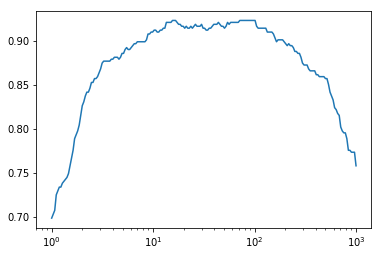

In [50]:
from sklearn.grid_search import GridSearchCV
import warnings

bandwidths = 10 **np.linspace(0,3,200)

grid = GridSearchCV(NotNaiveBayes(), {'bandwidth': bandwidths})
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    grid.fit(X, y)
scores = [val.mean_validation_score for val in grid.grid_scores_]

plt.semilogx(bandwidths, scores)
print(grid.best_params_)
print('accuracy=', grid.best_score_)

가장 좋은 bandwidth 는 15.5정도의 값으로 나타났다. 

이때 train set에서의 정확도는 92.3 프로이다. 

이를 test set에 적용하여 정확도를 살펴보자. 

In [51]:
# test set 에서 적용
model = NotNaiveBayes(bandwidth=15.52)
model.fit(X, y)
y_predict = model.predict(X_test)
accuracy_score(y_test, y_predict)

0.93859649122807021

놀랍게도 train set보다 test set에서의 정확도가 더 높았다...! 

당황스럽긴 하지만, 93.85% 의 accuracy를 얻었다. 

앞에서 예측한것 처럼 나이브 베이즈 모형에 비해서 성능이 좋기는 하였으나, 

0.9% 정도의 차이로, 큰 개선은 없었다. 

또 한 가지 주목할 것은 간단한 logistic regression을 통해 세운 모형의 정확도가 95.6%로 가장 높았다는 것이다.

복잡한 기계학습 모형을 사용하는 것이 능사가 아님을 보여주는 예시로 생각된다. 

표본의 크기가 크지 않을때는 중요한 변수를 찾아내어, 이를 적절히 활용하는 것이 더 나을 수도 있다..!는 교훈을 얻었다.ㅎㅎ

또 로지스틱 회귀는 해석이 용이하기 때문에, 

radius_mean, texture_mean, concavity_mean, radius_se, concavity_se 같은 변수들이 암세포를 탐지하는데에 중요한 변수라는 사실도 알 수 있었다. 

이는 암세포는 세포 분열을 자주하기 때문에, 

핵이 빽빽하게 뭉쳐있기보다는 느슨하고 흐느적 거리는 비정형의 모양을 띌 것이라는 논리적 추정과도 일치한다. 

데이터의 결과와 논리적 해석이 맞아드는 것을 보니, 꽤 흥미로운 데이터분석이었던것 같다. 

### 아래는 심심해서 그냥 로지스틱 회귀에 들어간 변수들만 가지고 베이즈 추정 해봄 - 보고 지우삼

In [54]:
X = train_set[['radius_mean', 'texture_mean','concavity_mean','radius_se','concavity_se']]
y = train_set.diagnosis
X_test = test_set[['radius_mean', 'texture_mean','concavity_mean','radius_se','concavity_se']]
y_test = test_set.diagnosis

{'bandwidth': 1.2315506032928261}
accuracy= 0.8945054945054945


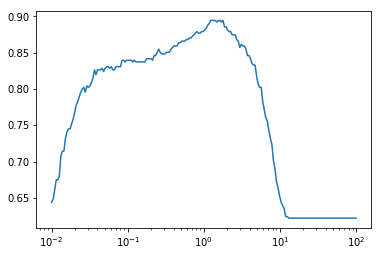

In [56]:
from sklearn.grid_search import GridSearchCV
import warnings

bandwidths = 10 **np.linspace(-2,2,200)

grid = GridSearchCV(NotNaiveBayes(), {'bandwidth': bandwidths})
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    grid.fit(X, y)
scores = [val.mean_validation_score for val in grid.grid_scores_]

plt.semilogx(bandwidths, scores)
print(grid.best_params_)
print('accuracy=', grid.best_score_)

In [57]:
# test set 에서 적용
model = NotNaiveBayes(bandwidth=15.52)
model.fit(X, y)
y_predict = model.predict(X_test)
accuracy_score(y_test, y_predict)

0.64912280701754388